In [109]:
from PIL import Image
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from pathlib import Path
from skimage.color import rgb2gray
from skimage import io
from skimage import exposure
import cv2

In [30]:
base_path = os.getcwd()
image_path = os.path.join(base_path, 'images')
annotation_path = os.path.join(base_path, 'Annotation')

def get_bounding_boxes(annot):
    xml = annot
    tree = ET.parse(xml)
    root = tree.getroot()
    objects = root.findall('object')
    bbox = []
    for o in objects:
        bndbox = o.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        bbox.append((xmin,ymin,xmax,ymax))
    return bbox

def get_image(annot):
    base_path = os.getcwd()
    image_path = os.path.join(base_path, 'Images')
    image_name = f"{os.path.basename(annot)}.jpg"
    breed_name = os.path.basename(os.path.dirname(annot))
    return os.path.join(image_path, breed_name, image_name)

def crop_and_save_image(image_path, bounding_boxes):
    img = Image.open(image_path)

    for idx, box in enumerate(bounding_boxes):
        cropped_image = img.crop(box).resize((128, 128), Image.LANCZOS)
        
        base_filename = os.path.basename(image_path)
        new_filename = f"{os.path.splitext(base_filename)[0]}_cropped_{idx}{os.path.splitext(base_filename)[1]}"
        cropped_image_path = os.path.join("croppedImages", new_filename)
        
        Path(cropped_image_path).parent.mkdir(parents=True, exist_ok=True)
        
        cropped_image.convert('RGB').save(cropped_image_path)
        print(f"Saved cropped image to {cropped_image_path}")

def image_process(interested_classes):
    annotation_files = [
        os.path.join(annotation_path, interested_class, file_name)
        for interested_class in interested_classes
        for file_name in os.listdir(os.path.join(annotation_path, interested_class))
        if not os.path.isdir(os.path.join(annotation_path, interested_class, file_name))
    ]

    for index, annotation in enumerate(annotation_files, start=1):
        print(f"Processing annotation {index}/{len(annotation_files)}: {annotation}")
        bounding_boxes = get_bounding_boxes(annotation)
        image_file_path = get_image(annotation)

        if not os.path.exists(image_file_path):
            print(f"Image file not found: {image_file_path}")
            continue

        crop_and_save_image(image_file_path, bounding_boxes)

## Cropping and Resize Images in Your 4-class Images Dataset

In [31]:
interested_classes = [
    'n02099712-Labrador_retriever', 
    'n02100735-English_setter', 
    'n02113799-standard_poodle', 
    'n02107312-miniature_pinscher'
]

image_process(interested_classes)

Processing annotation 1/675: C:\Users\pavan\OneDrive\Desktop\MS Docs\sem-2\Data Mining\Assignment\StanfordDogs\Annotation\n02099712-Labrador_retriever\n02099712_1150
Saved cropped image to croppedImages\n02099712_1150_cropped_0.jpg
Processing annotation 2/675: C:\Users\pavan\OneDrive\Desktop\MS Docs\sem-2\Data Mining\Assignment\StanfordDogs\Annotation\n02099712-Labrador_retriever\n02099712_1200
Saved cropped image to croppedImages\n02099712_1200_cropped_0.jpg
Processing annotation 3/675: C:\Users\pavan\OneDrive\Desktop\MS Docs\sem-2\Data Mining\Assignment\StanfordDogs\Annotation\n02099712-Labrador_retriever\n02099712_1229
Saved cropped image to croppedImages\n02099712_1229_cropped_0.jpg
Saved cropped image to croppedImages\n02099712_1229_cropped_1.jpg
Processing annotation 4/675: C:\Users\pavan\OneDrive\Desktop\MS Docs\sem-2\Data Mining\Assignment\StanfordDogs\Annotation\n02099712-Labrador_retriever\n02099712_1254
Saved cropped image to croppedImages\n02099712_1254_cropped_0.jpg
Proces

## Image Processing

In [23]:
# Function to get two images from each class
def get_images_from_classes(root_dir, count = 2):
    """Getting specific images from the root directory"""
    image_files = [file for file in os.listdir(root_dir) if file.endswith(".jpg")]
    return [cv2.imread(os.path.join(root_dir, img)) for img in image_files[:count]]
    
# Function to convert image to grayscale
def convert_image_to_grayscale(images):
    """Convert images to grayscalse using """
    grayscale_images = [rgb2gray(img) for img in images]
    return grayscale_images

# histogram for original and grayscale image
def equalize_image_histograms(grayscale_images):
    """Equalize the grayscale images with histogram"""
    equalized_images = [exposure.equalize_hist(img) for img in grayscale_images]
    return equalized_images

# function for ploting images and graph
def plot_graph_with_image(original_img, grayscale_img, equalized_img, title_prefix):
    plt.figure(figsize=(25,10))

    # show original image
    plt.subplot(2, 3, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title(f"{title_prefix} - Original")
    plt.axis("off")
    
    # show grayscale image
    plt.subplot(2, 3, 2)
    plt.imshow(grayscale_img, cmap="gray")
    plt.title(f"{title_prefix} - Grayscale")
    plt.axis("off")

    # show equalized image
    plt.subplot(2, 3, 3)
    plt.imshow(equalized_img, cmap="gray")
    plt.title(f"{title_prefix} - Equalized")
    plt.axis("off")

    # histogram of original image
    plt.subplot(2, 3, 4)
    plt.hist(grayscale_img.ravel(), bins=256, range=[0, 1], color='brown', alpha=0.7, label='Original Grayscale')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    # histogram of equalized grayscale
    plt.subplot(2, 3, 5)
    plt.hist(equalized_img.ravel(), bins=256, range=[0, 1], color='orange', alpha=0.7, label='Equalized Grayscale')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    plt.tight_layout()
    plt.show()


# display grayscale images with equalized_images
def display_image(original_img, grayscale_img, equalized_img, image_title):
    for index, title in enumerate(image_title):
        plot_graph_with_image(original_img[index], grayscale_images[index], equalized_images[index], image_title[index])

    

In [24]:
# image directories of selected dog breed classes
image_dirs = []

for class_name in interested_classes:
    image_dirs.append("images/" + class_name)

image_dirs

['images/n02099712-Labrador_retriever',
 'images/n02100735-English_setter',
 'images/n02113799-standard_poodle',
 'images/n02107312-miniature_pinscher']

In [25]:
all_images = [img for image_dir in image_dirs for img in get_images_from_classes(image_dir)]
grayscale_images = convert_image_to_grayscale(all_images)
equalized_images = equalize_image_histograms(grayscale_images)

titles = []

for val in interested_classes:
    title = val.split("-")
    titles.append(title[1] + "-1")
    titles.append(title[1] + "-2")
print(titles)


['Labrador_retriever-1', 'Labrador_retriever-2', 'English_setter-1', 'English_setter-2', 'standard_poodle-1', 'standard_poodle-2', 'miniature_pinscher-1', 'miniature_pinscher-2']


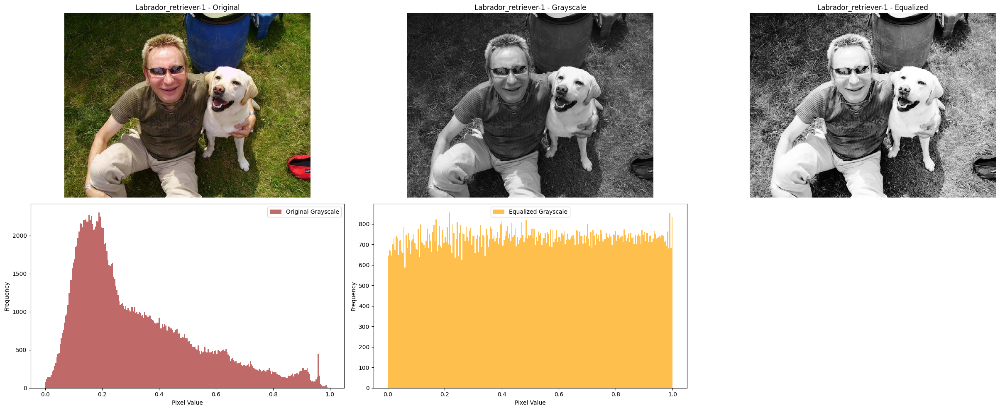

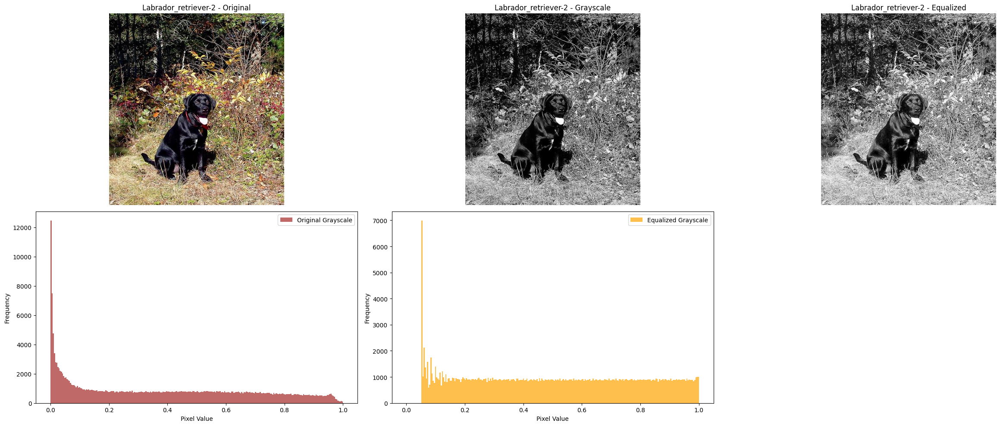

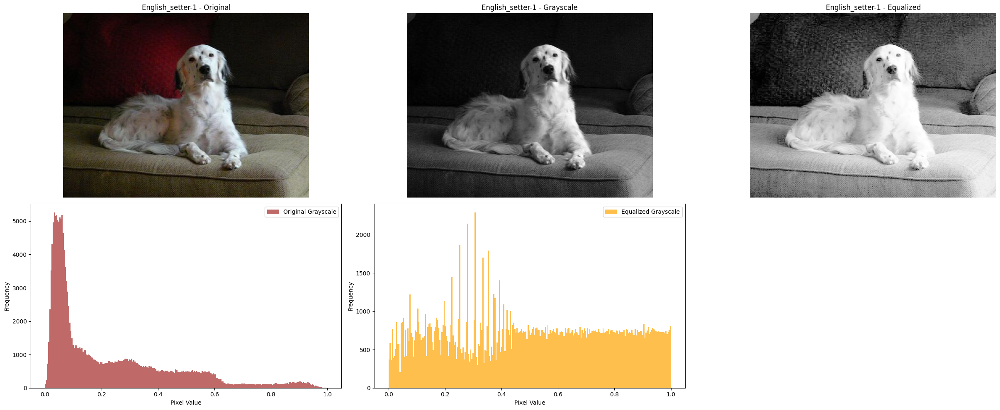

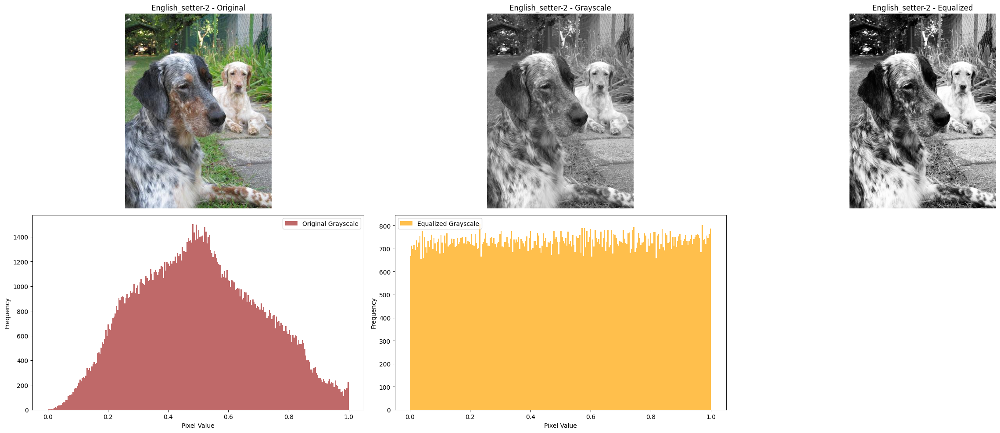

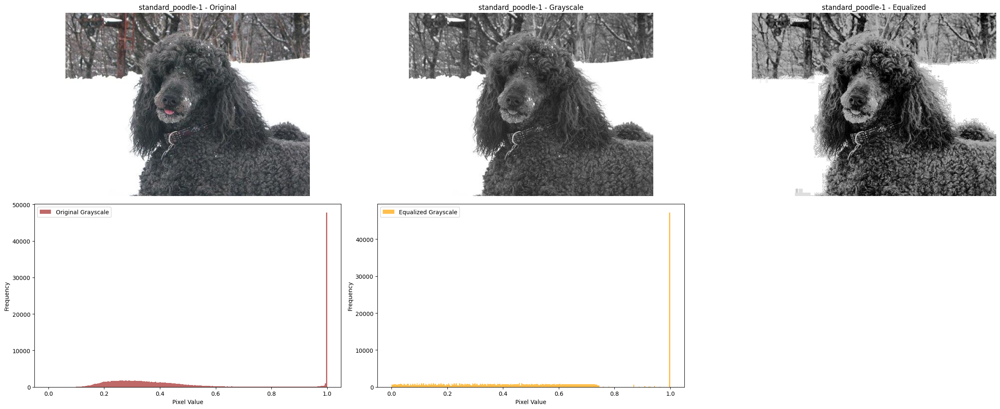

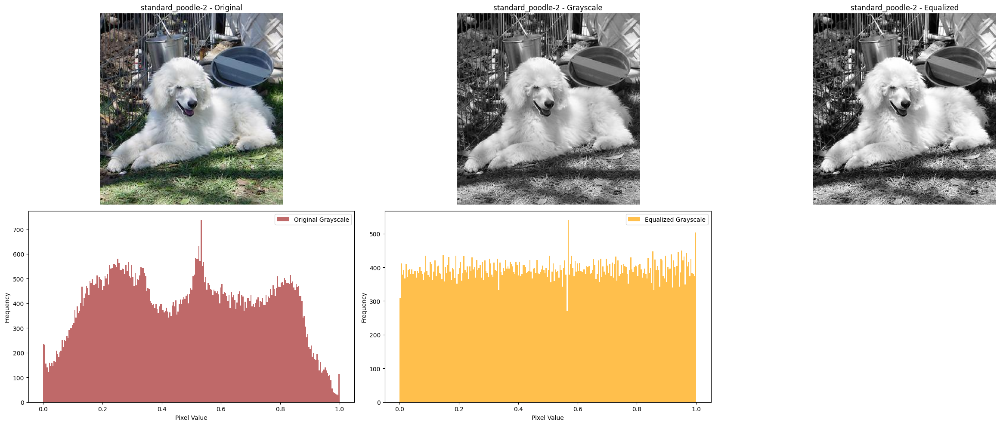

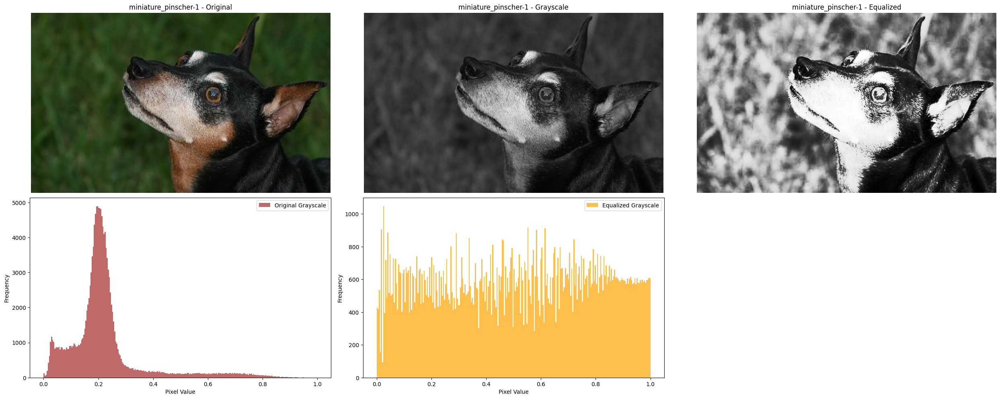

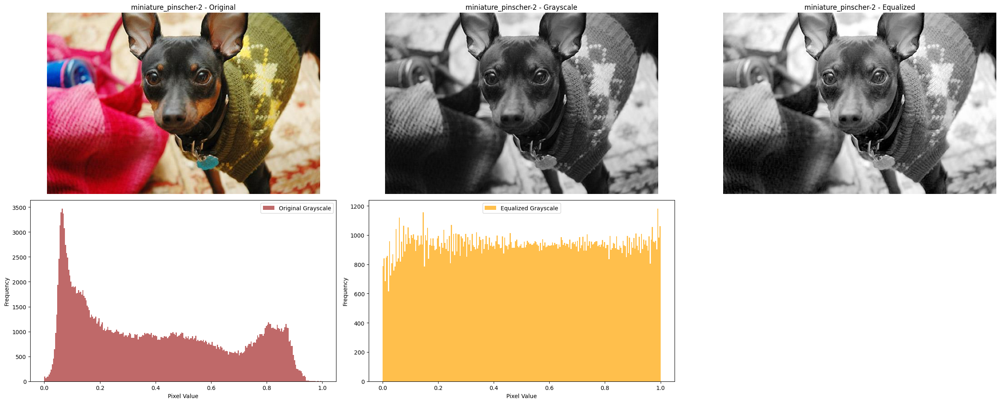

In [26]:
display_image(all_images, grayscale_images, equalized_images, titles)

+ Historgram equalization used to imporve the contract and shows detailed view in grayscale image.
+ The last equalized image has an expanded intensity range that covers the full view and allowing for enhanced visibility.

## 2c Edge histogram

In [21]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from skimage import io, color, filters, exposure


In [22]:
base_dir = os.getcwd()
base_dir

'C:\\Users\\pavan\\OneDrive\\Desktop\\MS Docs\\sem-2\\Data Mining\\Assignment\\StanfordDogs'

In [66]:
# select 1 image from each class
def angle(dx, dy):
    return np.mod(np.arctan2(dx,dy), np.pi)

def show_images_and_histogram(list_of_images, base_dir):
    imgs_subdir = os.path.join(base_dir, 'images')

    for category, img_name in list_of_images:
        img_path = os.path.join(imgs_subdir, category, img_name)
        img = io.imread(img_path)

        # covert each image to grayscale
        grayscale_img = color.rgb2gray(img)

        # edge orientation angles
        dx = filters.sobel_h(grayscale_img)
        dy = filters.sobel_v(grayscale_img)
        angle_img = angle(dx, dy)

        # # histogram graph
        hist, hist_centers = exposure.histogram(angle_img, nbins=36, source_range='dtype')

        # # showing image
        plt.figure(figsize=(12,6))
        plt.subplot(1,2,1)
        plt.imshow(grayscale_img, cmap="gray")
        plt.title(f"{category} - {img_name}")
        plt.axis("off")

        # showing histogram
        plt.subplot(1,2,2)
        plt.bar(hist_centers, hist, width=0.1, align="center")
        plt.xlabel("Bins")
        plt.ylabel("Pixel Count")
        plt.title("Edge Orientation Histogram")

        plt.tight_layout()
        plt.show()


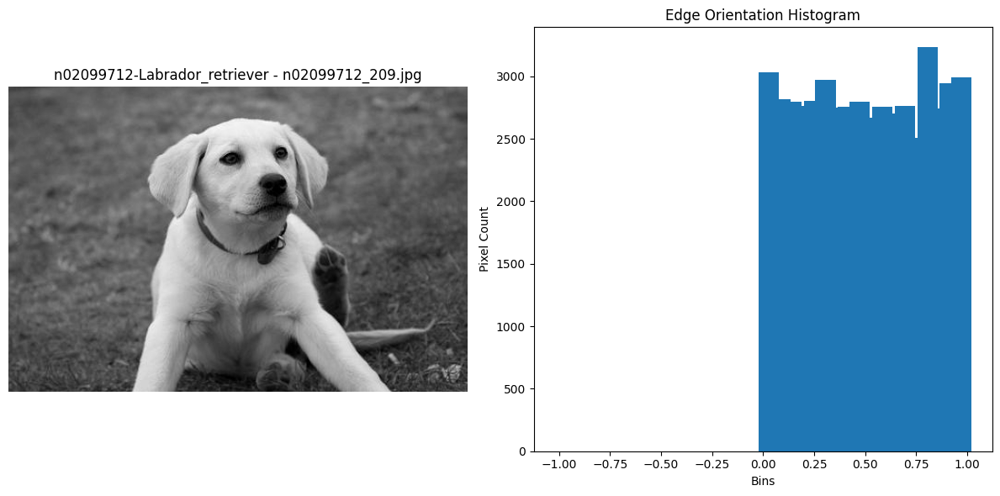

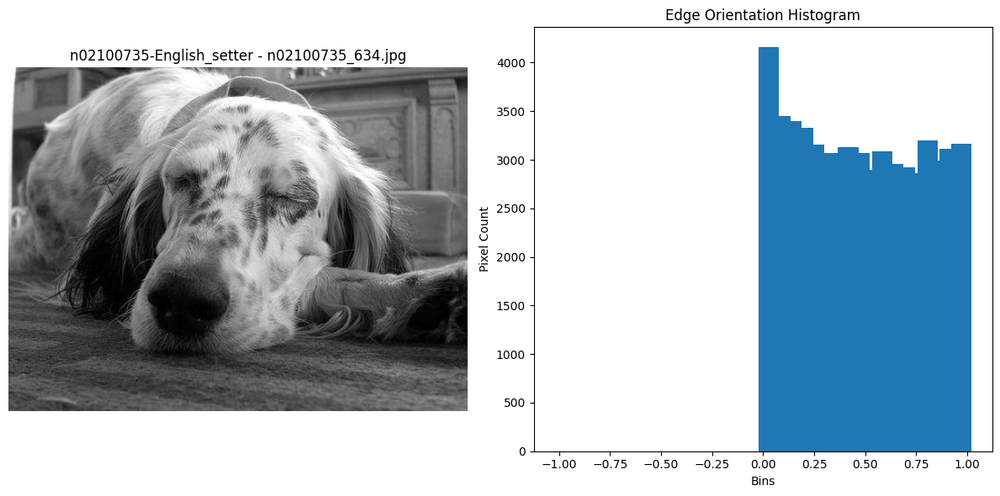

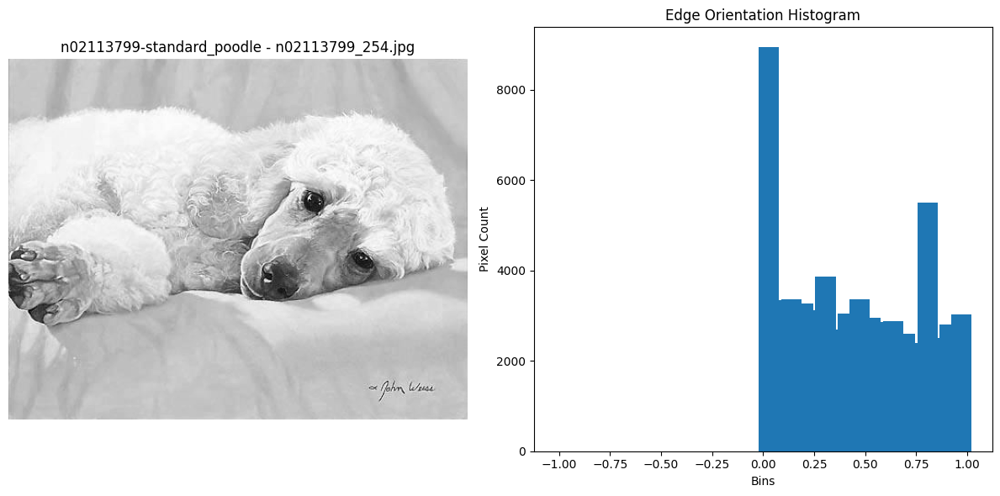

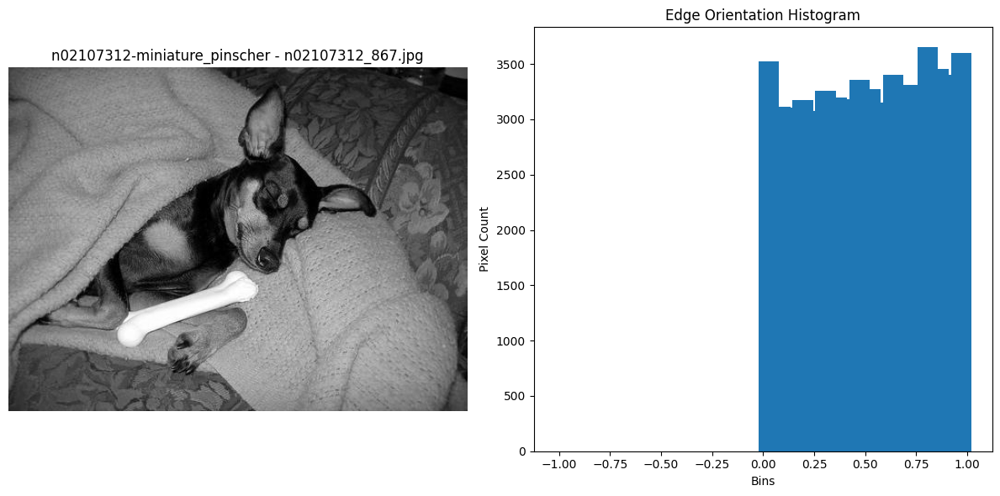

In [67]:
list_of_images = [
    ("n02099712-Labrador_retriever", "n02099712_209.jpg"),
    ("n02100735-English_setter", "n02100735_634.jpg"),
    ("n02113799-standard_poodle", "n02113799_254.jpg"),
    ("n02107312-miniature_pinscher", "n02107312_867.jpg")
]

show_images_and_histogram(list_of_images, base_dir)

## 2d. Histogram Comparison (Measures of Similarity and Dissimilarity)

In [3]:
import os
import numpy as np
from skimage import io, color, filters, exposure
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances, cosine_distances

In [47]:
def angle(dx, dy):
    return np.mod(np.arctan2(dx,dy), np.pi)

def generate_edge_histogram(image):
    grayscale_img = color.rgb2gray(image)
    dx = filters.sobel_h(grayscale_img)
    dy = filters.sobel_v(grayscale_img)
    angles = angle(dx, dy)
    hist, _ = np.histogram(angles, bins = 36, range=(-np.pi, np.pi))
    return hist

def process_selected_images(base_dir, list_of_images):
    edge_hist = {}
    for category, img_name in list_of_images:
        img_path = os.path.join(base_dir, 'images', category, img_name)
        img = io.imread(img_path)
        hist = generate_edge_histogram(img)
        edge_hist[img_name] = hist
    return edge_hist

def compare_histogram(edge_hist, title):
    histograms = list(edge_hist.values())
    img_names = list(edge_hist.keys())

    euclidean_dist = euclidean_distances(histograms)
    manhattan_dist = manhattan_distances(histograms)
    cosine_dist = cosine_distances(histograms)

    print(title + ":")
    for i in range(len(img_names)):
        for j in range(i + 1, len(img_names)):
            print(f"\nBetween {img_names[i]} and {img_names[j]}:")
            print(f"  Euclidean: {euclidean_dist[i][j]:.4f}")
            print(f"  Manhattan: {manhattan_dist[i][j]:.4f}")
            print(f"  Cosine: {cosine_dist[i][j]:.4f}")
  
    

In [51]:
selected_same_class_images = [
    ("n02099712-Labrador_retriever", "n02099712_209.jpg"),
    ("n02099712-Labrador_retriever", "n02099712_1828.jpg"),
]

selected_different_class_images = [
    ("n02099712-Labrador_retriever", "n02099712_209.jpg"),
    ("n02100735-English_setter", "n02100735_634.jpg"),
]

edge_hist1 = process_selected_images(base_dir, selected_same_class_images)
compare_histogram(edge_hist, "Comparison for images from the same class")

print("\n")

edge_hist2 = process_selected_images(base_dir, selected_different_class_images)
compare_histogram(edge_hist2, "Comparison for images from the different class")

Comparison for images from the same class:

Between n02099712_209.jpg and n02099712_1828.jpg:
  Euclidean: 12011.6031
  Manhattan: 43324.0000
  Cosine: 0.0448


Comparison for images from the different class:

Between n02099712_209.jpg and n02100735_634.jpg:
  Euclidean: 7161.8269
  Manhattan: 22840.0000
  Cosine: 0.0060
